In [23]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
from pyclustree import clustree
import matplotlib.pyplot as plt

In [139]:
sc.set_figure_params(dpi=100)
pd.set_option('display.max_rows', 10)

In [ ]:
adata = sc.read_h5ad('final_scanVI/final_object.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 726054 × 2505
    obs: 'Barcode', 'Dataset', 'ID_batch_covariate', 'Unique_ID', 'Technology', 'n_genes', 'n_counts', 'log_counts', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'leiden', 'batch', 'leiden_0.2', 'leiden_0.2_annotation', 'leiden_subcluster', 'level0_leiden_subcluster', 'leiden_0.5', 'is_outlier_total_counts', 'outlier', 'infercnv_score_malignant', 'infercnv_score_malignant_refined', 'cnv_score_abs', 'treatment_status', 'Level_0', 'MALAT1_lognorm', 'empty_droplet', 'ID_harmonised', 'Dataset_unique', 'Tissue', 'Age', 'Sex', 'Diabetes', 'Treatment', 'Global_Leiden', 'Treatment_Harmonized', 'Treatment_Category', 'Myeloid_leiden_0.75', 'Fibroblast_leiden_0.75', 'Lymphoid_leiden_0.75', 'Endothelial_Cell_leiden_0.75', 'Malignant_leiden_0.75', 'Ductal_Cell_leiden_0.75', 'Schwann_Cell_leiden_0.75', 'Adipocyte_leiden_0.75', 'Endo

In [36]:
cluster_keys = ['Level_1', 'Level_2', 'Level_3', 'Level_4', 'Level_4_refined', 'Level_5']

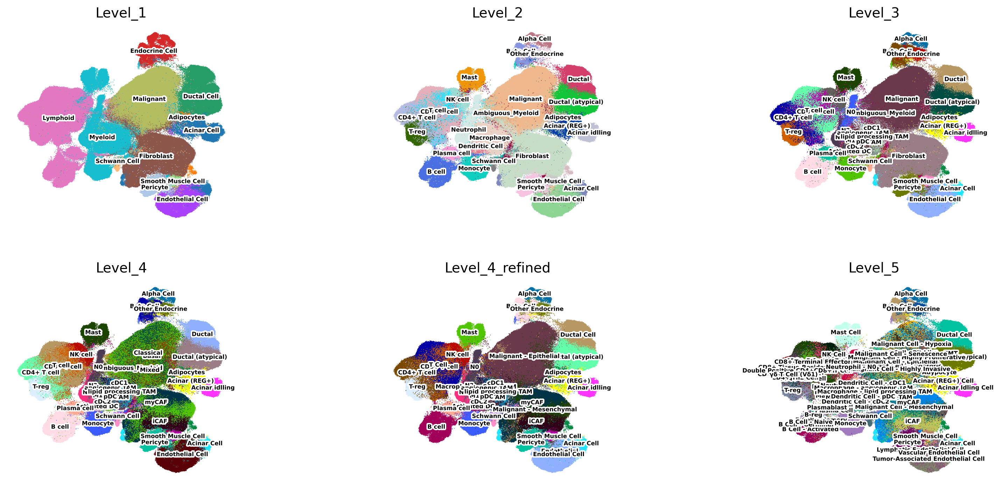

In [73]:
sc.pl.umap(adata, color=cluster_keys, ncols=3, size=2, wspace=0.5, legend_loc='on data', legend_fontsize=6, legend_fontoutline=3, frameon=False)

In [28]:
adata_temp = adata[adata.obs.Level_4 == cell_type].copy()

In [30]:
adata_temp.obs.Level_5.unique()

['Smooth Muscle Cell']
Categories (1, object): ['Smooth Muscle Cell']

--------------------------------------------------
Skipping because only 1 unique Level 5 Cell Type in cDC2
--------------------------------------------------
--------------------------------------------------
Skipping because only 1 unique Level 5 Cell Type in NK cell
--------------------------------------------------
--------------------------------------------------
Skipping because only 1 unique Level 5 Cell Type in Mast
--------------------------------------------------
--------------------------------------------------
Skipping because only 1 unique Level 5 Cell Type in N1
--------------------------------------------------
--------------------------------------------------
Skipping because only 1 unique Level 5 Cell Type in myCAF
--------------------------------------------------
--------------------------------------------------
Skipping because only 1 unique Level 5 Cell Type in N2
--------------------------------------------------
----------------------------------------------

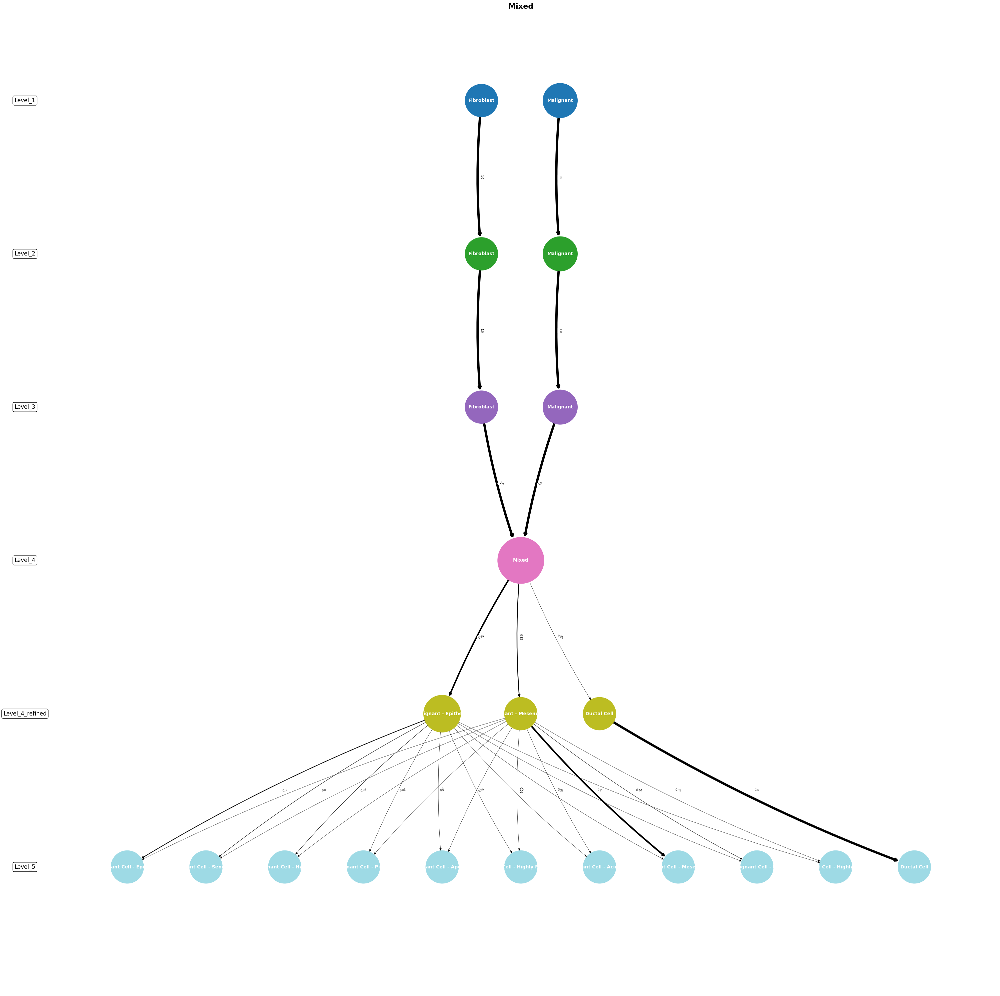

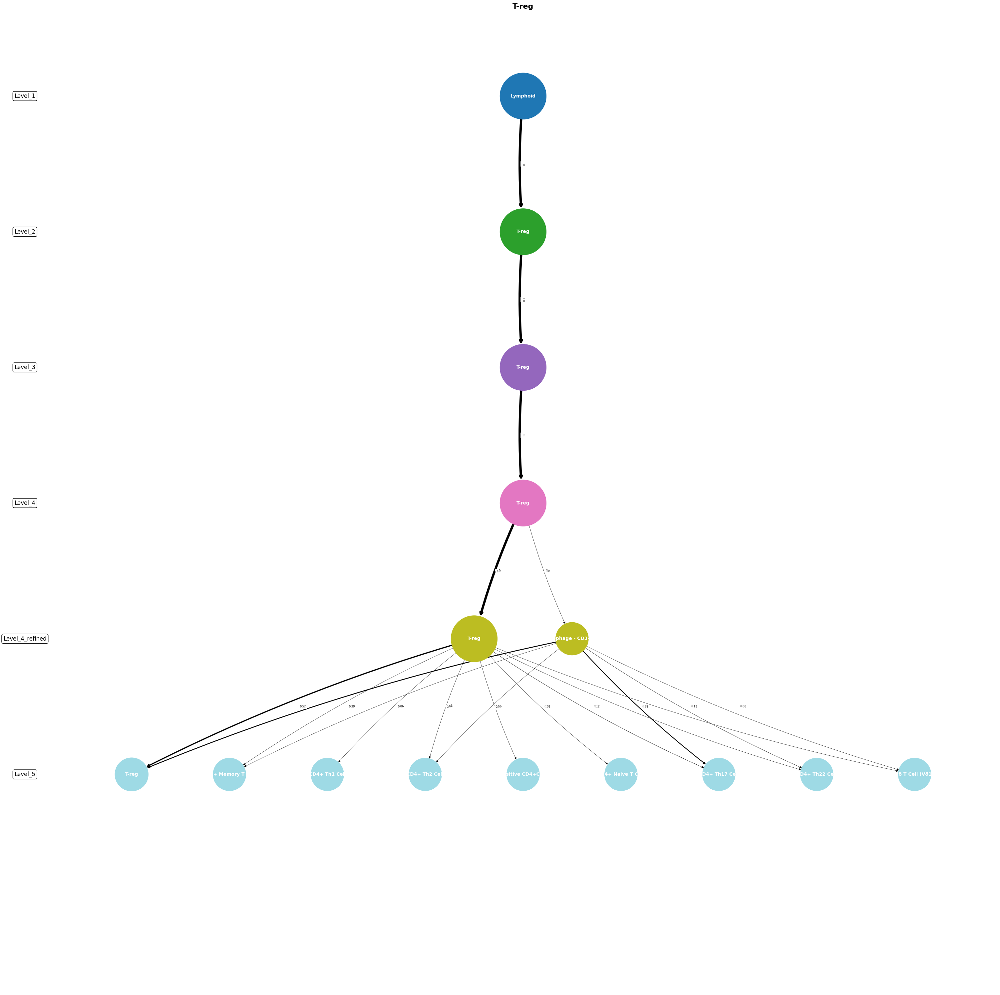

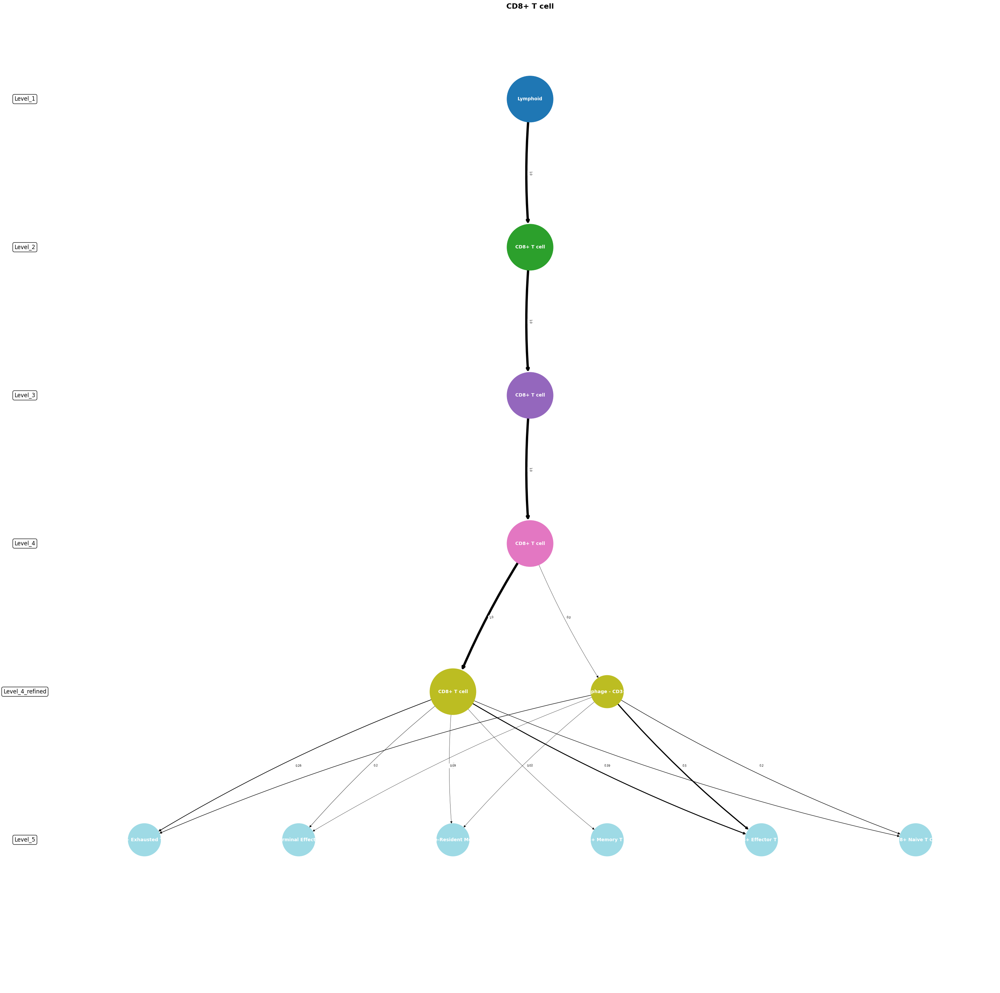

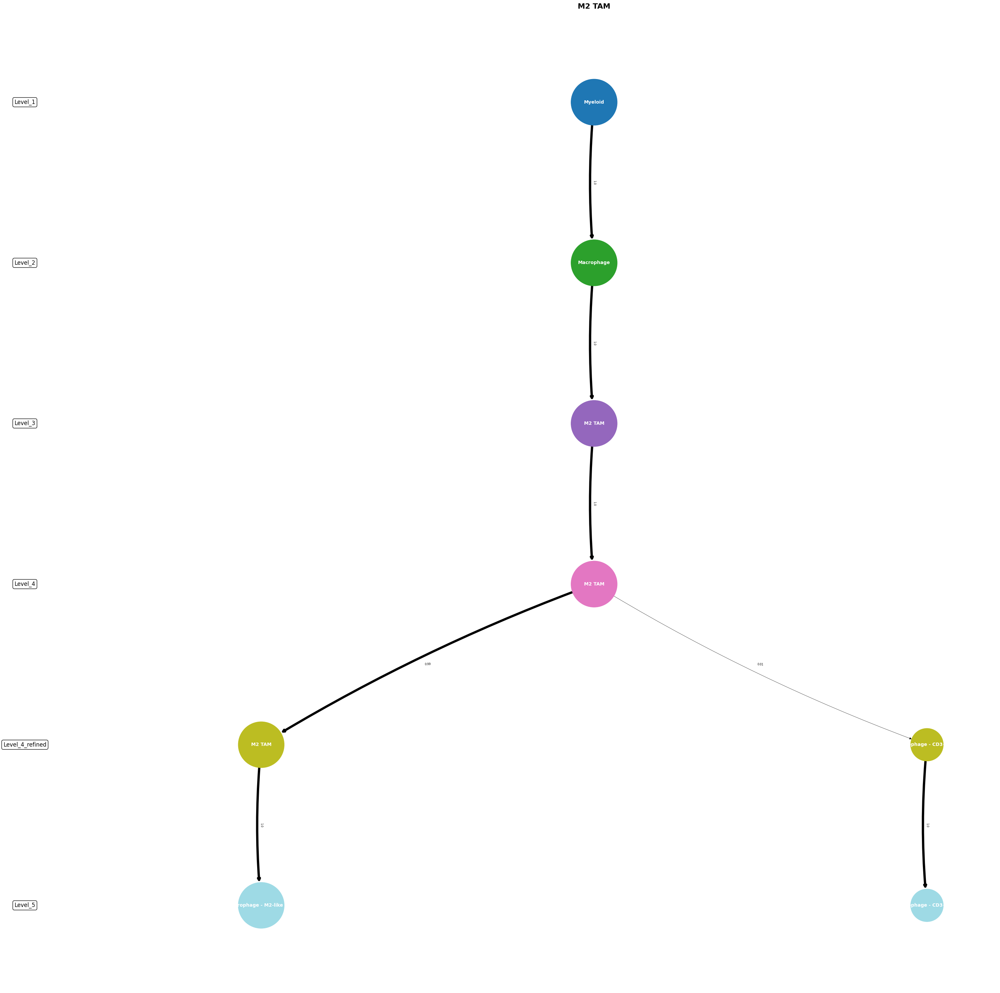

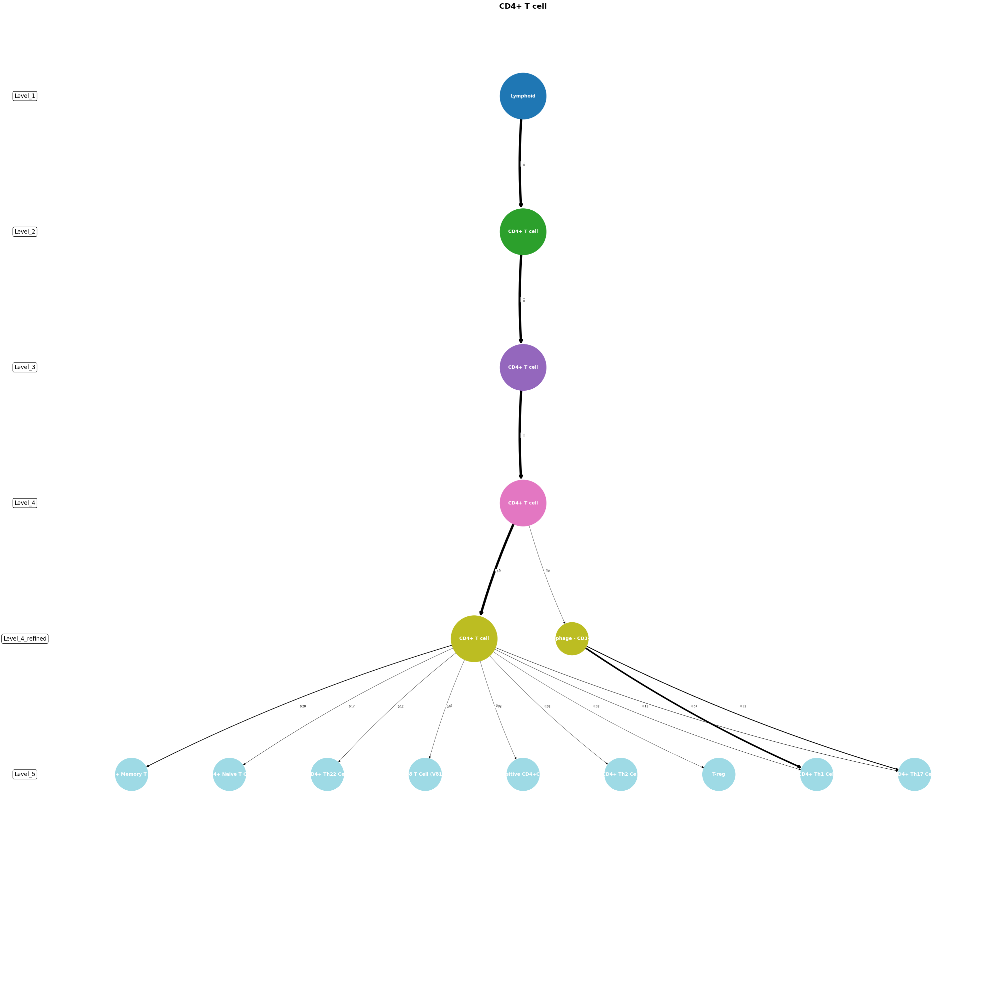

...

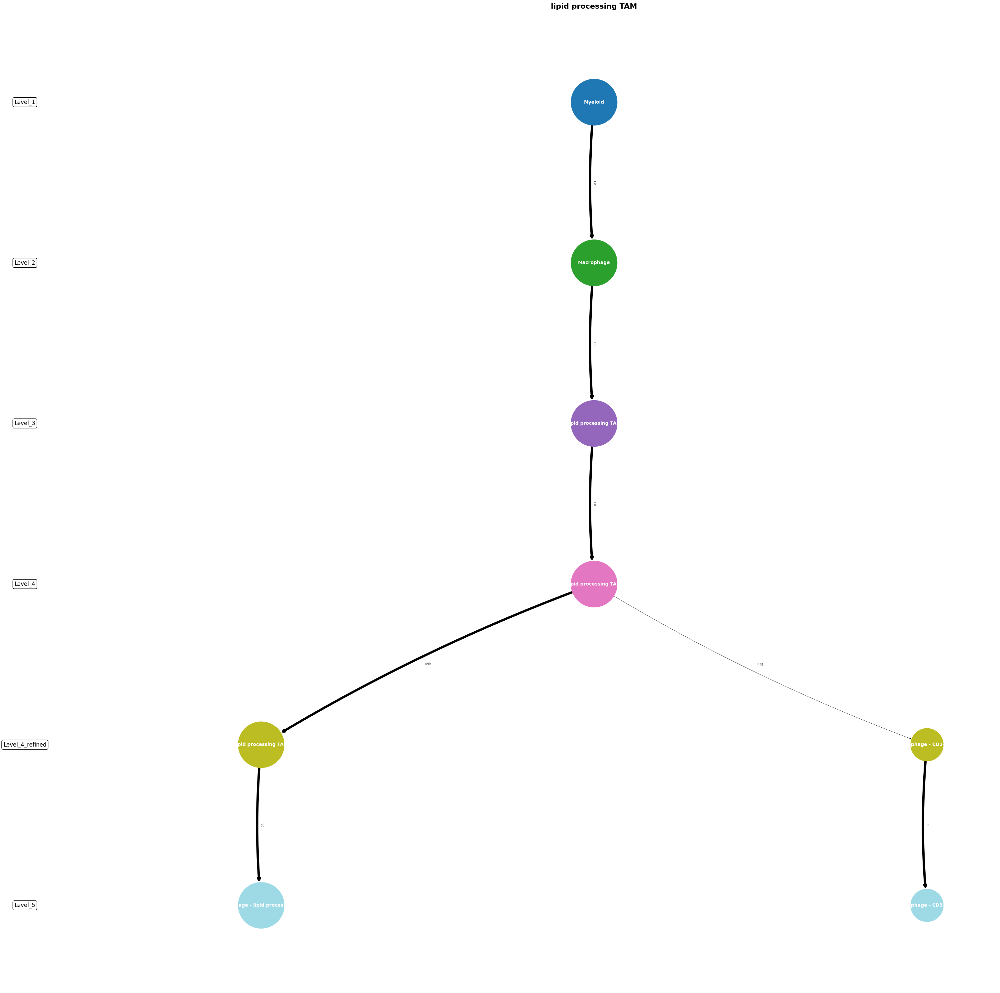

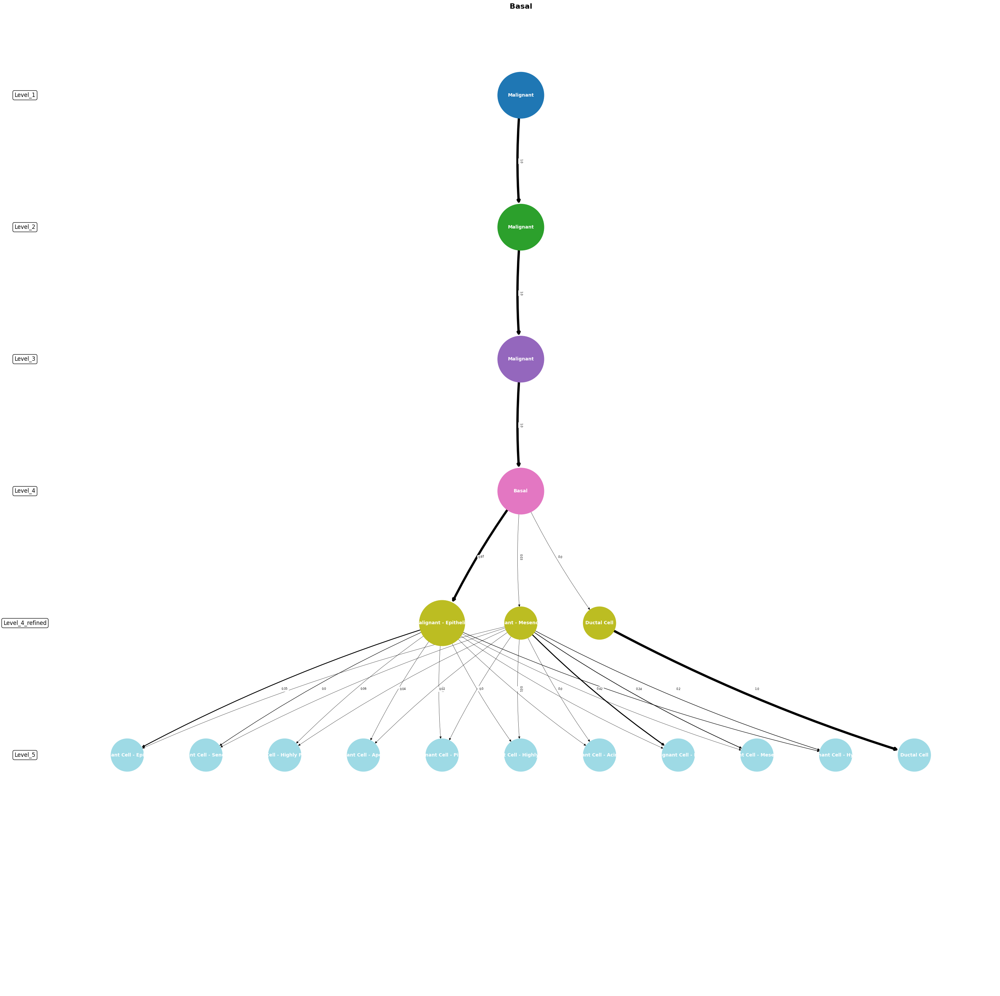

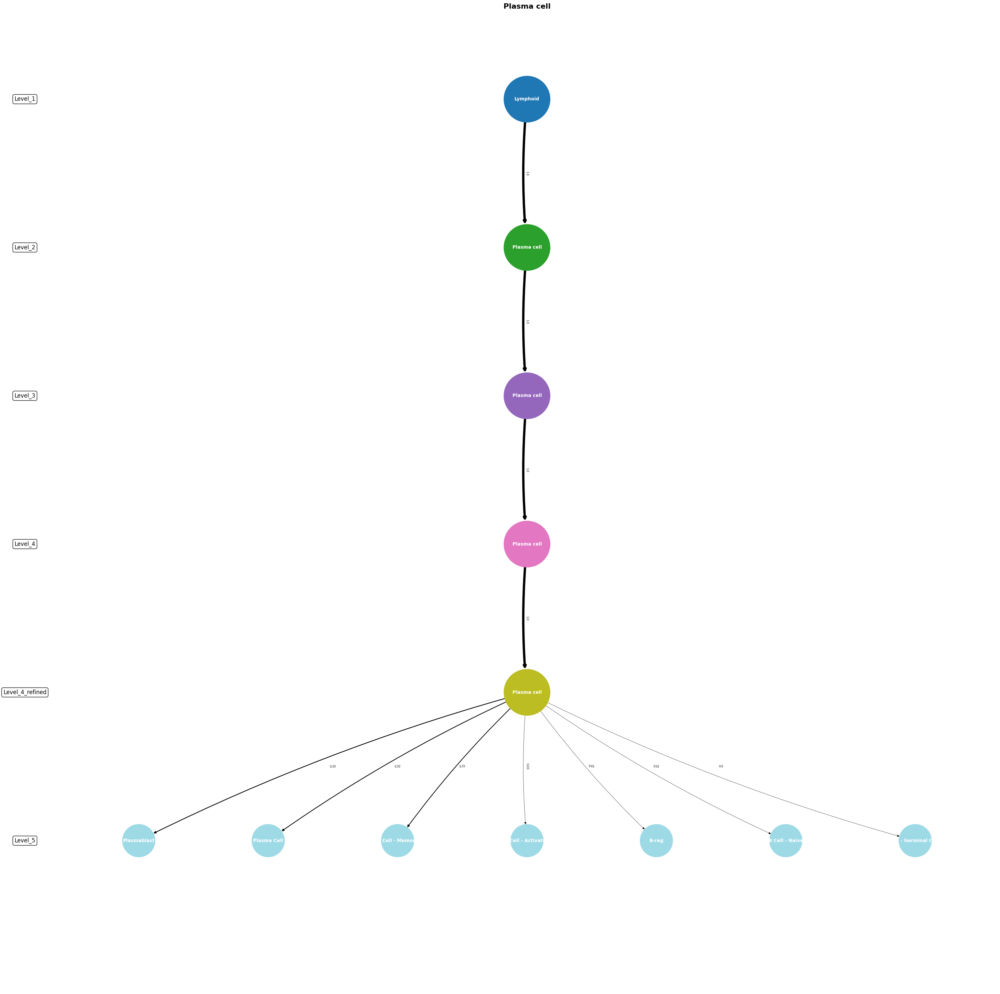

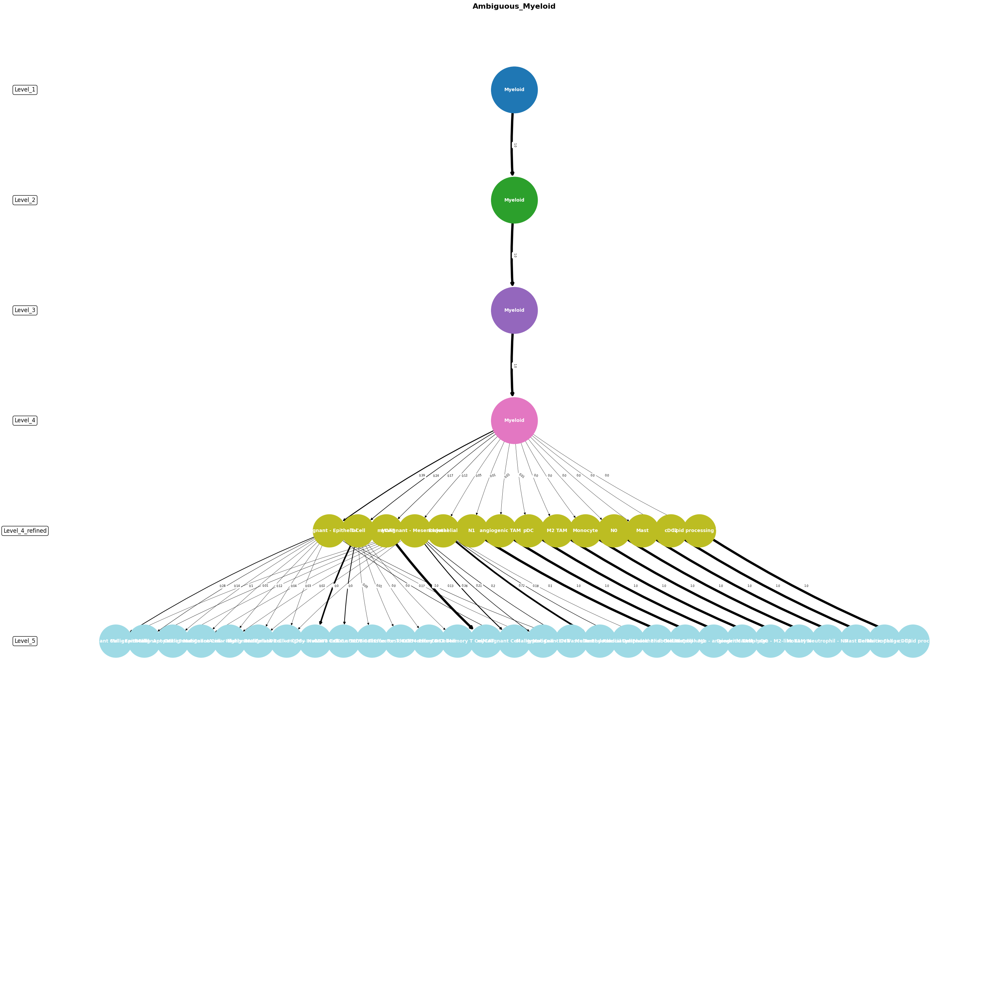

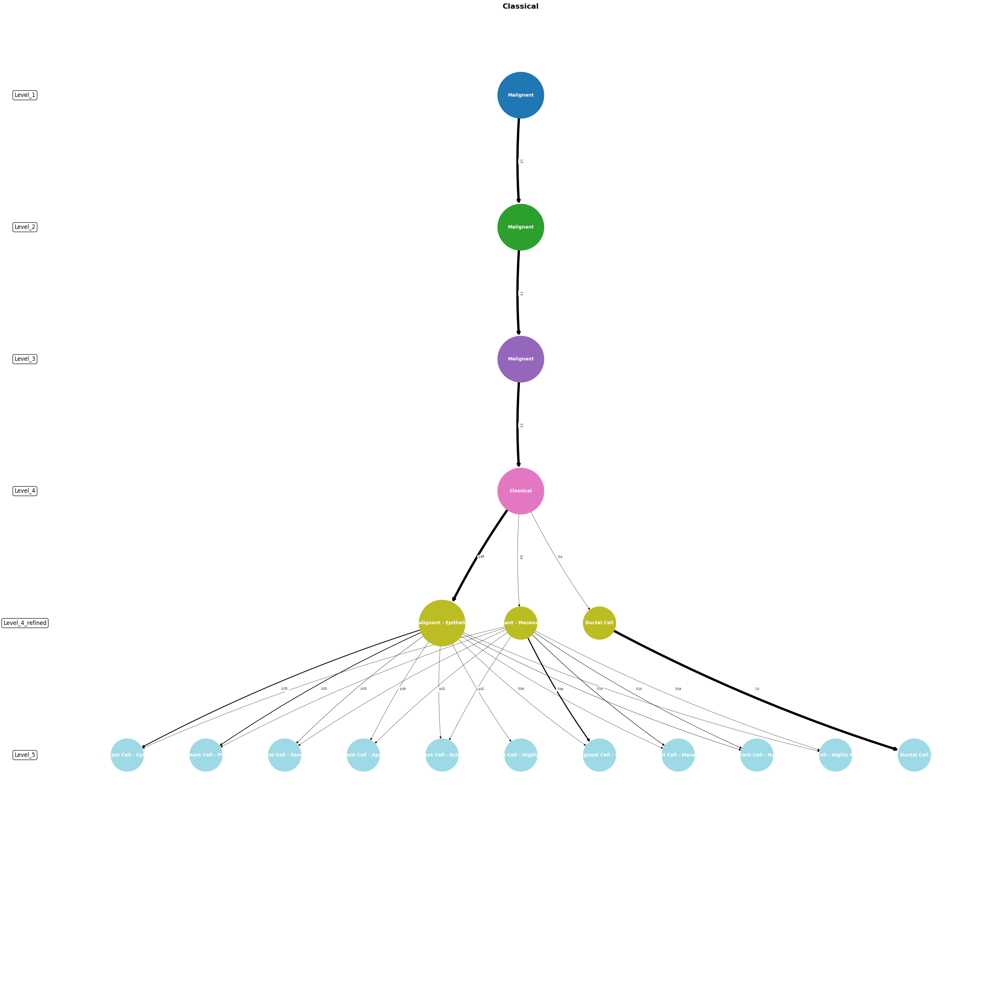

In [40]:
for cell_type in adata.obs.Level_4.unique().tolist():
    adata_temp = adata[adata.obs.Level_4 == cell_type] #.copy()
    if adata_temp.obs.Level_5.nunique() == 1:
        print('-'*50)
        print(f'Skipping because only 1 unique Level 5 Cell Type in {cell_type}')
        print('-'*50)
        continue
    fig = clustree(
        adata_temp,
        cluster_keys,
        title=f'{cell_type}',
        show_fraction=True, 
        node_size_range=(5000, 10000), x_spacing = 2, 
        # edge_width_range=(5,10),
    )
    
    # Adjust figure size and resolution
    fig.set_size_inches(30, 30)
    fig.set_dpi(100)
    fig.tight_layout()
    fig.show()

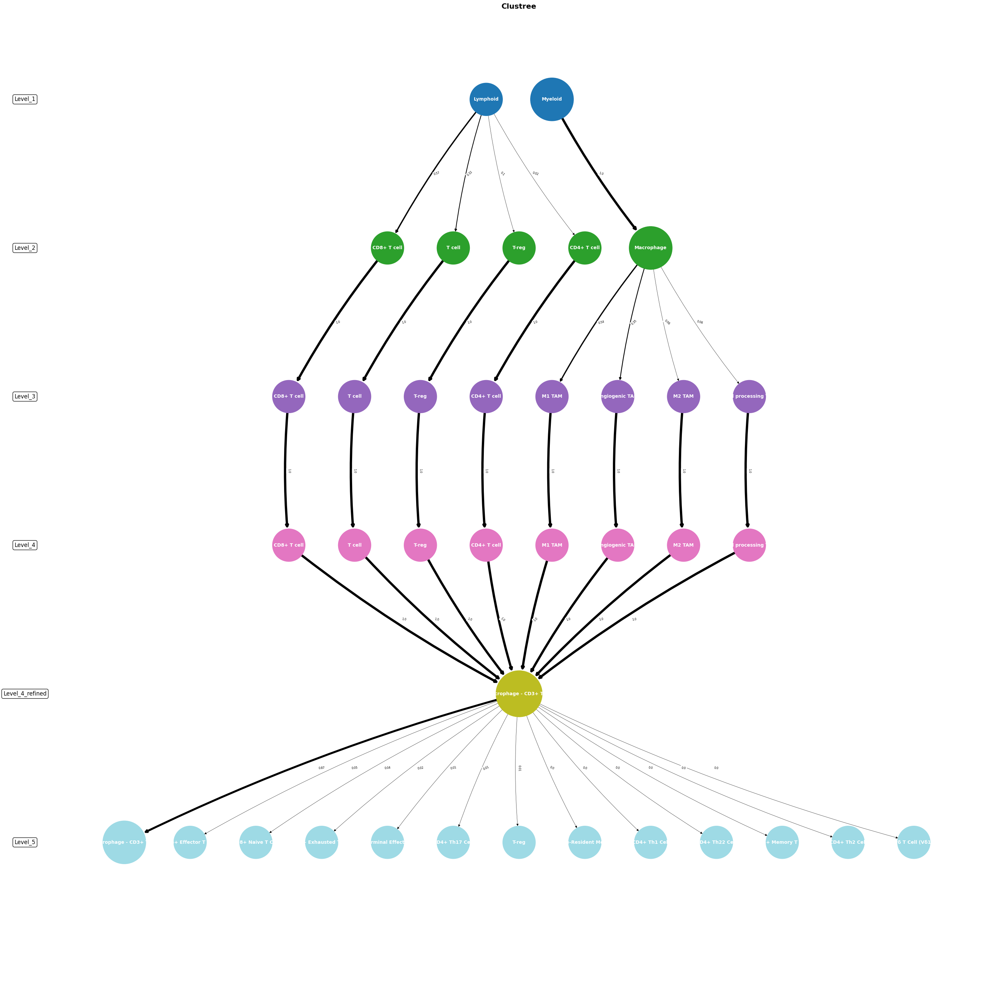

In [42]:
adata_temp = adata[adata.obs.Level_4_refined.str.contains('CD3+')] #.copy()
fig = clustree(
    adata_temp,
    cluster_keys,
    title="Clustree",
    show_fraction=True, 
    node_size_range=(5000, 10000), x_spacing = 2, 
    # edge_width_range=(5,10),
)

# Adjust figure size and resolution
fig.set_size_inches(30, 30)
fig.set_dpi(100)
fig.tight_layout()
fig.show()

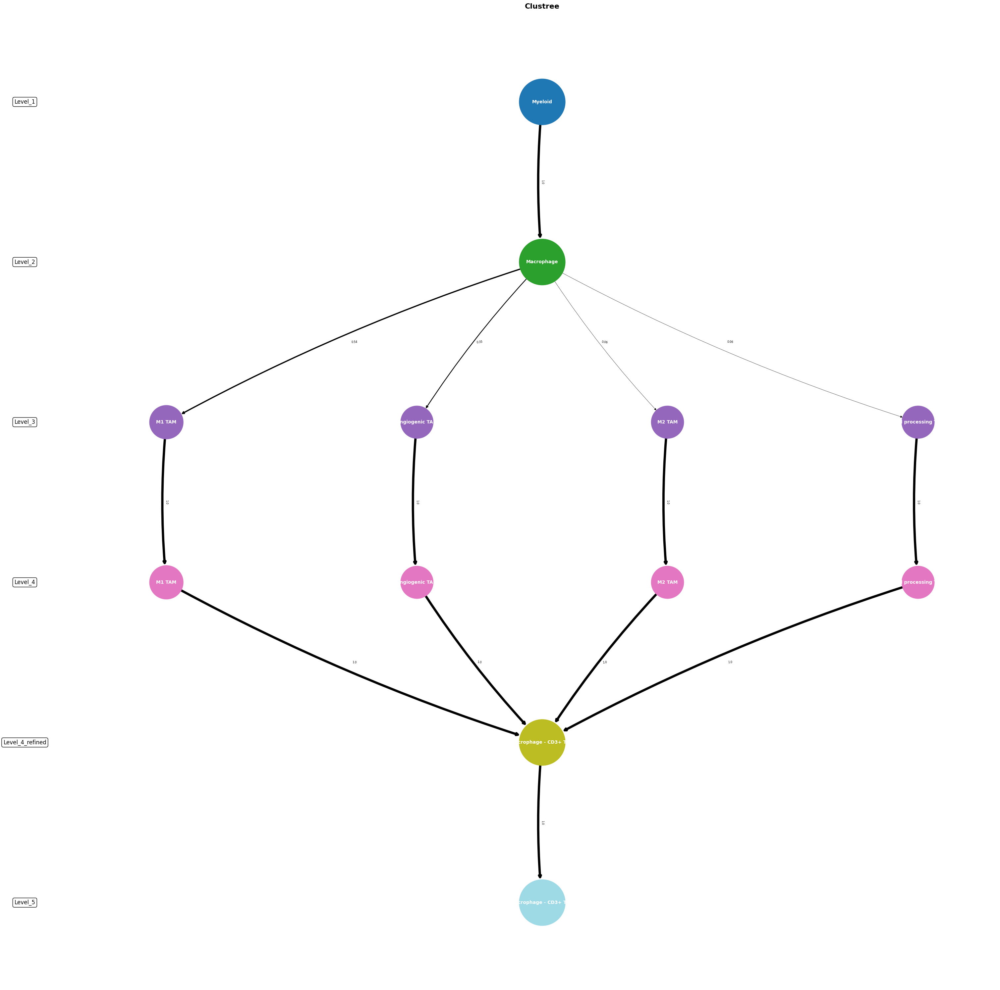

In [39]:
adata_temp = adata[adata.obs.Level_5.str.contains('CD3+')] #.copy()
fig = clustree(
    adata_temp,
    cluster_keys,
    title="Clustree",
    show_fraction=True, 
    node_size_range=(5000, 10000), x_spacing = 2, 
    # edge_width_range=(5,10),
)

# Adjust figure size and resolution
fig.set_size_inches(30, 30)
fig.set_dpi(100)
fig.tight_layout()
fig.show()

# Fix CD3+ in Level_5

In [49]:
mask = [adata.obs.Level_4_refined.str.contains('CD3+') != adata.obs.Level_5.str.contains('CD3+')]

In [56]:
adata.obs.loc[mask, 'Level_5'] = 'Macrophage - CD3+ TAM'

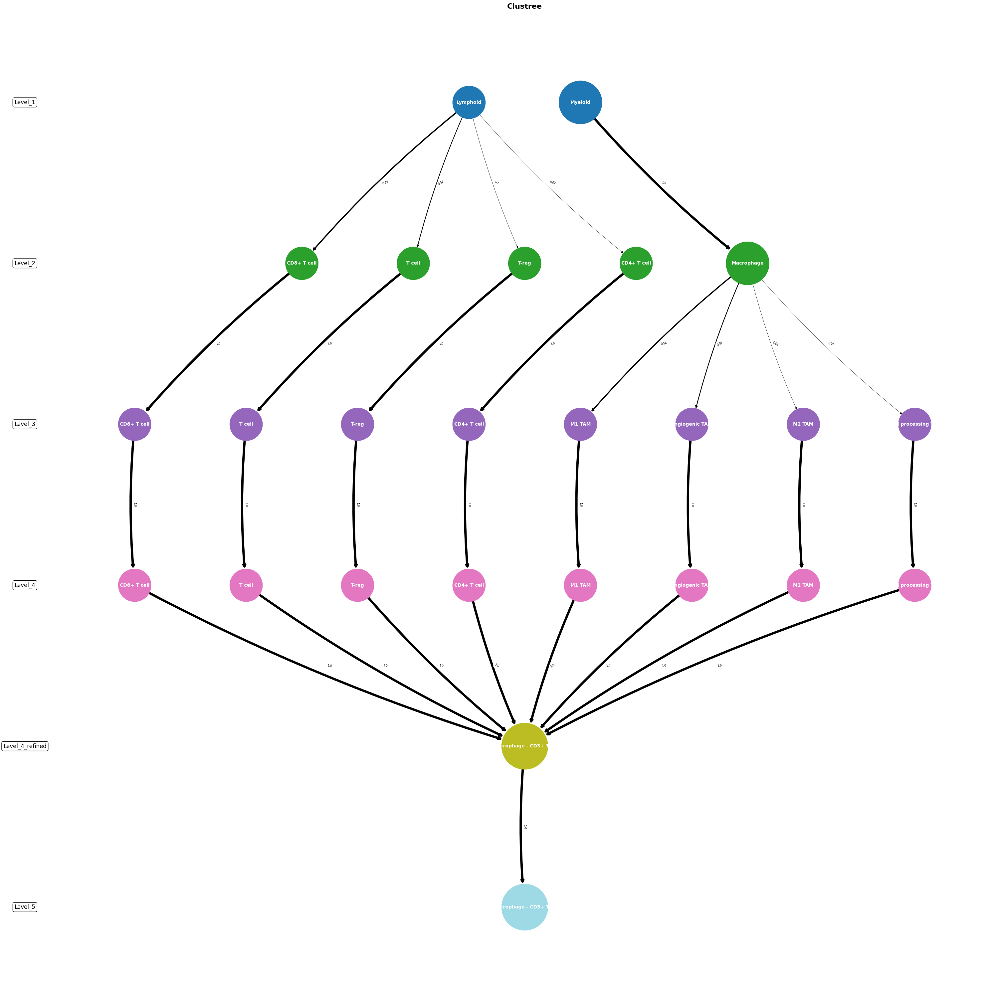

In [57]:
adata_temp = adata[adata.obs.Level_4_refined.str.contains('CD3+')] #.copy()
fig = clustree(
    adata_temp,
    cluster_keys,
    title="Clustree",
    show_fraction=True, 
    node_size_range=(5000, 10000), x_spacing = 2, 
    # edge_width_range=(5,10),
)

# Adjust figure size and resolution
fig.set_size_inches(30, 30)
fig.set_dpi(100)
fig.tight_layout()
fig.show()

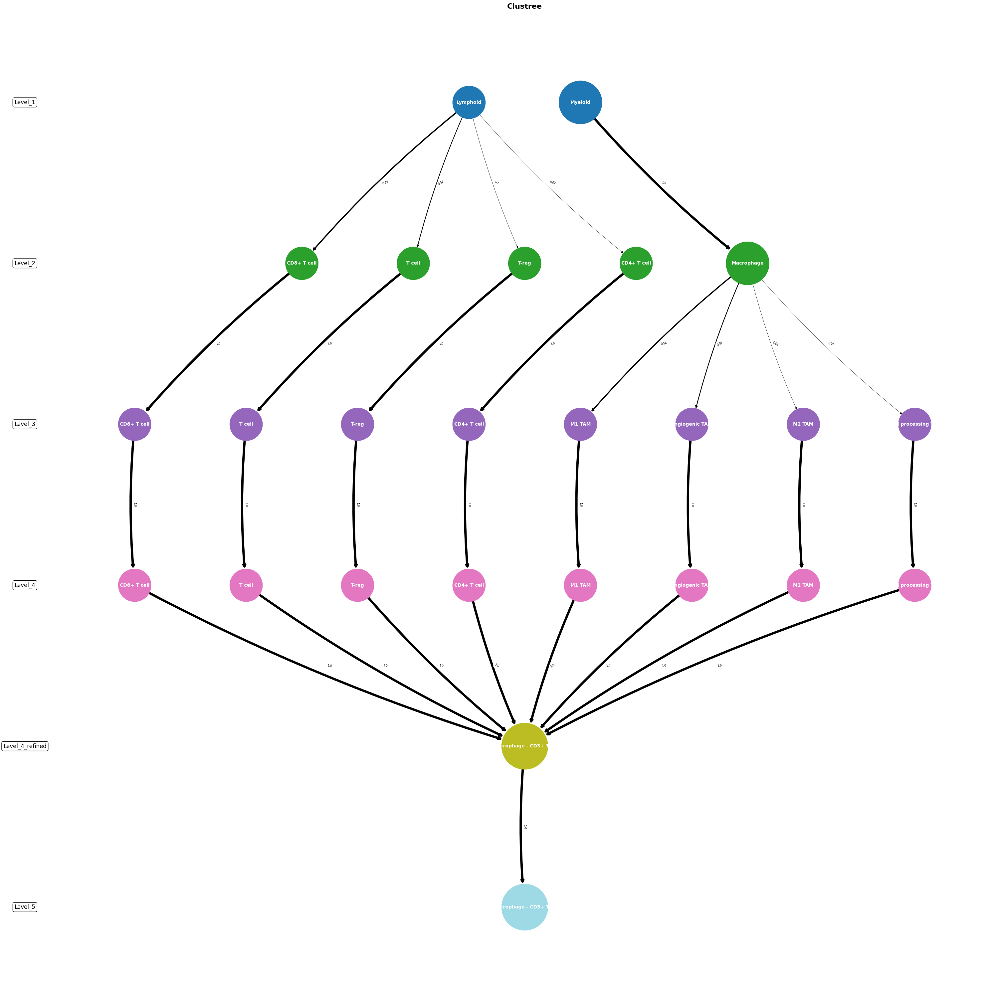

In [58]:
adata_temp = adata[adata.obs.Level_5.str.contains('CD3+')] #.copy()
fig = clustree(
    adata_temp,
    cluster_keys,
    title="Clustree",
    show_fraction=True, 
    node_size_range=(5000, 10000), x_spacing = 2, 
    # edge_width_range=(5,10),
)

# Adjust figure size and resolution
fig.set_size_inches(30, 30)
fig.set_dpi(100)
fig.tight_layout()
fig.show()

# UMAP

In [75]:
cluster_keys = ['Level_1', 'Level_2', 'Level_3', 'Level_4_refined', 'Level_5']

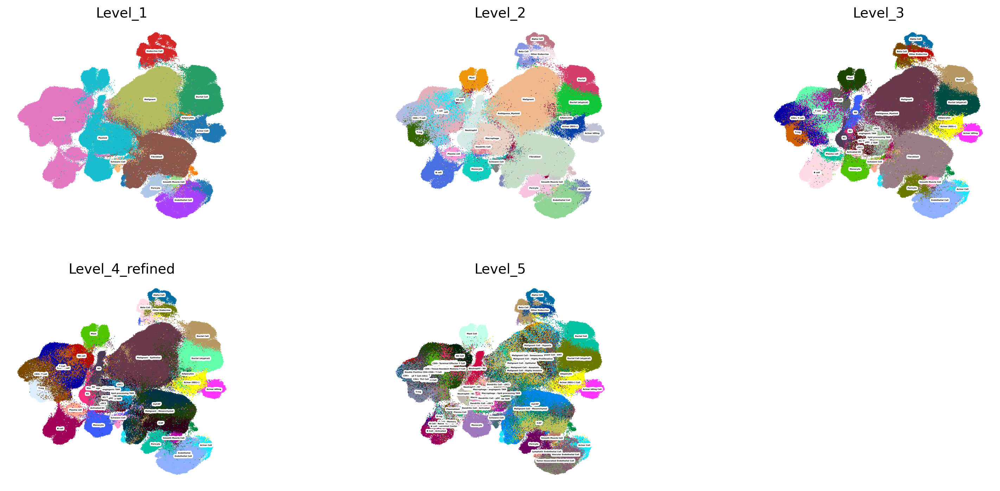

In [78]:
sc.pl.umap(adata, color=cluster_keys, ncols=3, size=2, wspace=0.5, legend_loc='on data', legend_fontsize=2, legend_fontoutline=3, frameon=False)

# Load the DF

In [124]:
df_map = pd.read_csv('Level_4_to_Level_1.csv', index_col=None, sep=';')

In [125]:
df_map

,Level_4,Level_3,Level_2,Level_1
0,CD4+ Memory T Cell,CD4+ T Cell,Lymphoid,Immune Cell
1,CD4+ Naive T Cell,CD4+ T Cell,Lymphoid,Immune Cell
2,CD4+ Th1 Cell,CD4+ T Cell,Lymphoid,Immune Cell
3,CD4+ Th2 Cell,CD4+ T Cell,Lymphoid,Immune Cell
4,CD4+ Th17 Cell,CD4+ T Cell,Lymphoid,Immune Cell
5,CD4+ Th22 Cell,CD4+ T Cell,Lymphoid,Immune Cell
6,T-reg,CD4+ T Cell,Lymphoid,Immune Cell
7,Double Positive CD4+CD8+ T Cell,Mixed T Cell,Lymphoid,Immune Cell
8,CD8+ Naive T Cell,CD8+ T Cell,Lymphoid,Immune Cell
9,CD8+ Effector T Cell,CD8+ T Cell,Lymphoid,Immune Cell


In [126]:
obs = adata.obs.copy()

In [143]:
obs.drop(['Level_1', 'Level_2', 'Level_3', 'Level_4_refined', 'Level_4'], axis=1, inplace=True)

In [148]:
obs['Level_1'] = obs.Level_5.map(dict(zip(df_map.Level_4,df_map.Level_1)))
obs['Level_2'] = obs.Level_5.map(dict(zip(df_map.Level_4,df_map.Level_2)))
obs['Level_3'] = obs.Level_5.map(dict(zip(df_map.Level_4,df_map.Level_3)))

In [150]:
obs.rename(columns={'Level_5': 'Level_4'}, inplace=True)

In [154]:
obs = obs[['Barcode', 'Dataset', 'ID_batch_covariate', 'Unique_ID', 'Technology',
       'n_genes', 'n_counts', 'log_counts', 'mt_frac', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito',
       'leiden', 'batch', 'leiden_0.2', 'leiden_0.2_annotation',
       'leiden_subcluster', 'level0_leiden_subcluster', 'leiden_0.5',
       'is_outlier_total_counts', 'outlier', 'infercnv_score_malignant',
       'infercnv_score_malignant_refined', 'cnv_score_abs', 'treatment_status',
       'Level_0', 'MALAT1_lognorm', 'empty_droplet', 'ID_harmonised',
       'Dataset_unique', 'Tissue', 'Age', 'Sex', 'Diabetes', 'Treatment',
       'Global_Leiden', 'Treatment_Harmonized', 'Treatment_Category',
       'Myeloid_leiden_0.75', 'Fibroblast_leiden_0.75', 'Lymphoid_leiden_0.75',
       'Endothelial_Cell_leiden_0.75', 'Malignant_leiden_0.75',
       'Ductal_Cell_leiden_0.75', 'Schwann_Cell_leiden_0.75',
       'Adipocyte_leiden_0.75', 'Endocrine_Cell_leiden_0.75',
       'Acinar_Cell_leiden_0.75', 'Pericyte_leiden_0.75',
       'Smooth_Muscle_Cell_leiden_0.75', 'NK_Cell_leiden_0.75', 'Condition',
       'combo', 'EMT category', 'EMT score', 'EMT_score_DL',
       'Suspicious_Normal',  'Level_1', 'Level_2', 'Level_3', 'Level_4', '_scvi_batch', '_scvi_labels',
      ]]

In [155]:
obs.head()

,Barcode,Dataset,ID_batch_covariate,Unique_ID,Technology,n_genes,n_counts,log_counts,mt_frac,n_genes_by_counts,...,EMT category,EMT score,EMT_score_DL,Suspicious_Normal,Level_1,Level_2,Level_3,Level_4,_scvi_batch,_scvi_labels
Dataset_Barcode,,,,,,,,,,,,,,,,,,,,,
Ding_AAACCCAAGTCATCGT-1-HT056P-S1PAA1-0-0-0-0,AAACCCAAGTCATCGT-1-HT056P-S1PAA1-0-0-0,Ding,HT056P1_Ding_scRNA-seq,HT056P1,scRNA-seq,2929,12375.0,9.423433,0.096727,2929,...,NaN,NaN,NaN,Other,Immune Cell,Myeloid,Dendritic Cell,Dendritic Cell - cDC2,4,58
Ding_AAACCCACAACCACGC-1-HT056P-S1PAA1-0-0-0-0,AAACCCACAACCACGC-1-HT056P-S1PAA1-0-0-0,Ding,HT056P1_Ding_scRNA-seq,HT056P1,scRNA-seq,3440,10981.0,9.303922,0.068573,3440,...,NaN,NaN,-1.481311,Other,Epithelial Cell,Malignant Cell,Malignant Cell - Mesenchymal,Malignant Cell - Mesenchymal,4,38
Ding_AAACCCACAACTCCCT-1-HT056P-S1PAA1-0-0-0-0,AAACCCACAACTCCCT-1-HT056P-S1PAA1-0-0-0,Ding,HT056P1_Ding_scRNA-seq,HT056P1,scRNA-seq,1976,5352.0,8.585226,0.113416,1976,...,NaN,NaN,NaN,Other,Immune Cell,Lymphoid,Mixed T Cell,Double Positive CD4+CD8+ T Cell,4,24
Ding_AAACCCACAGACAATA-1-HT056P-S1PAA1-0-0-0-0,AAACCCACAGACAATA-1-HT056P-S1PAA1-0-0-0,Ding,HT056P1_Ding_scRNA-seq,HT056P1,scRNA-seq,2446,7301.0,8.895766,0.151760,2446,...,NaN,NaN,NaN,Other,Immune Cell,Lymphoid,CD4+ T Cell,T-reg,4,53
Ding_AAACCCACATGCCGAC-1-HT056P-S1PAA1-0-0-0-0,AAACCCACATGCCGAC-1-HT056P-S1PAA1-0-0-0,Ding,HT056P1_Ding_scRNA-seq,HT056P1,scRNA-seq,2675,8489.0,9.046527,0.112852,2675,...,NaN,NaN,NaN,Other,Immune Cell,Lymphoid,CD4+ T Cell,T-reg,4,53


In [156]:
adata.obs = obs.copy()

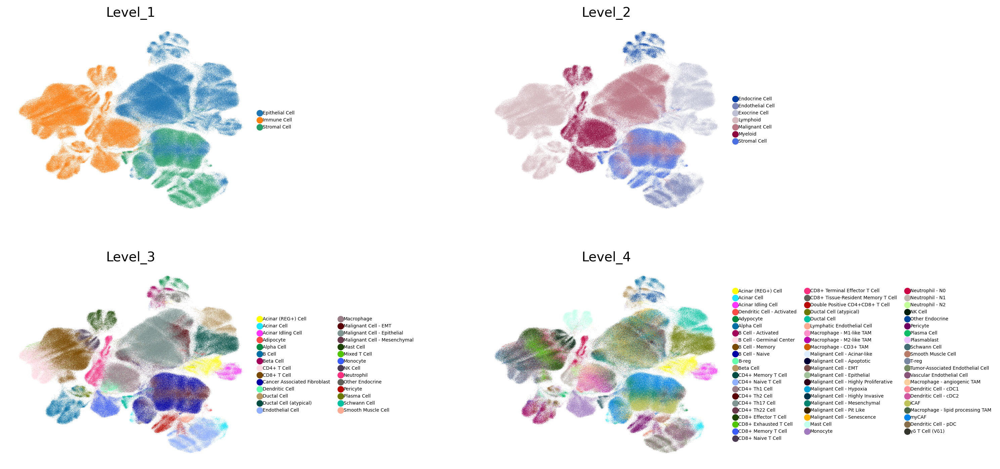

In [157]:
sc.pl.umap(adata, color=[ 'Level_1', 'Level_2', 'Level_3', 'Level_4'], ncols=2, frameon=False, legend_fontsize=5, wspace=0.75)

In [161]:
cluster_keys =  ['Level_1', 'Level_2', 'Level_3', 'Level_4']

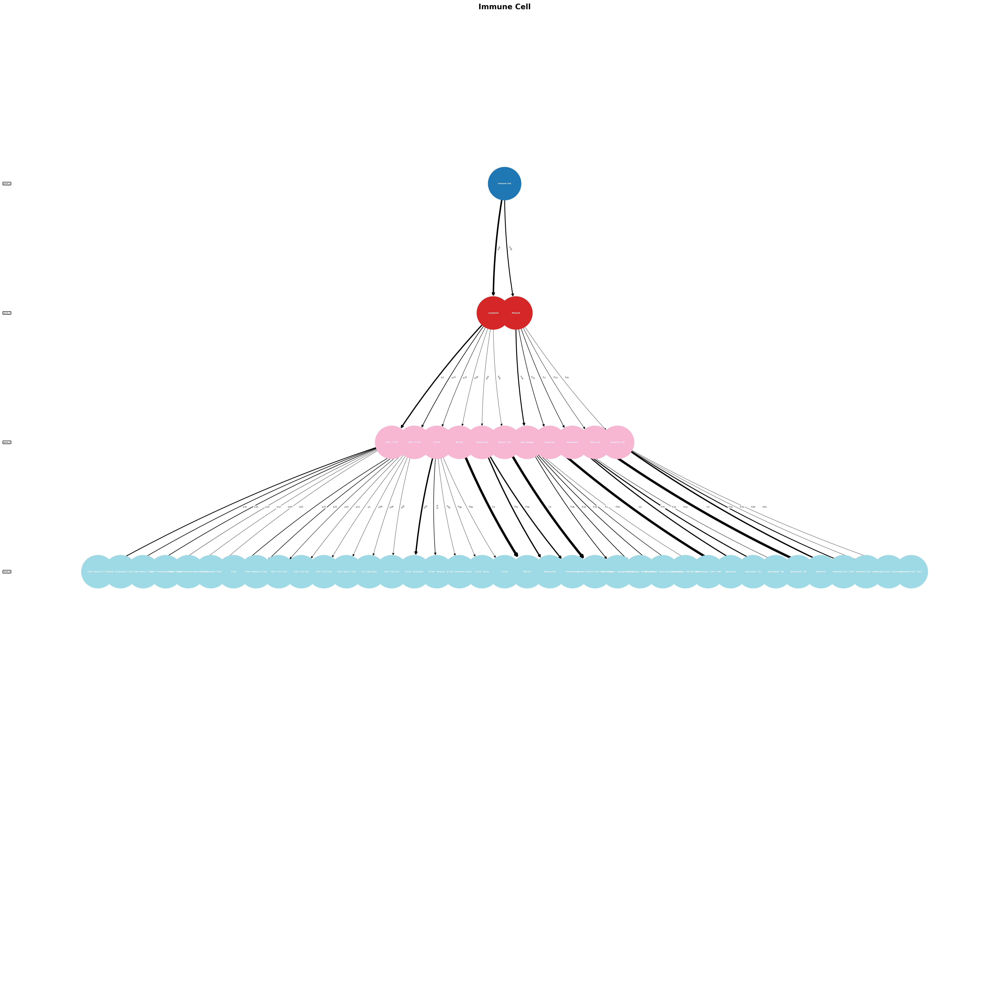

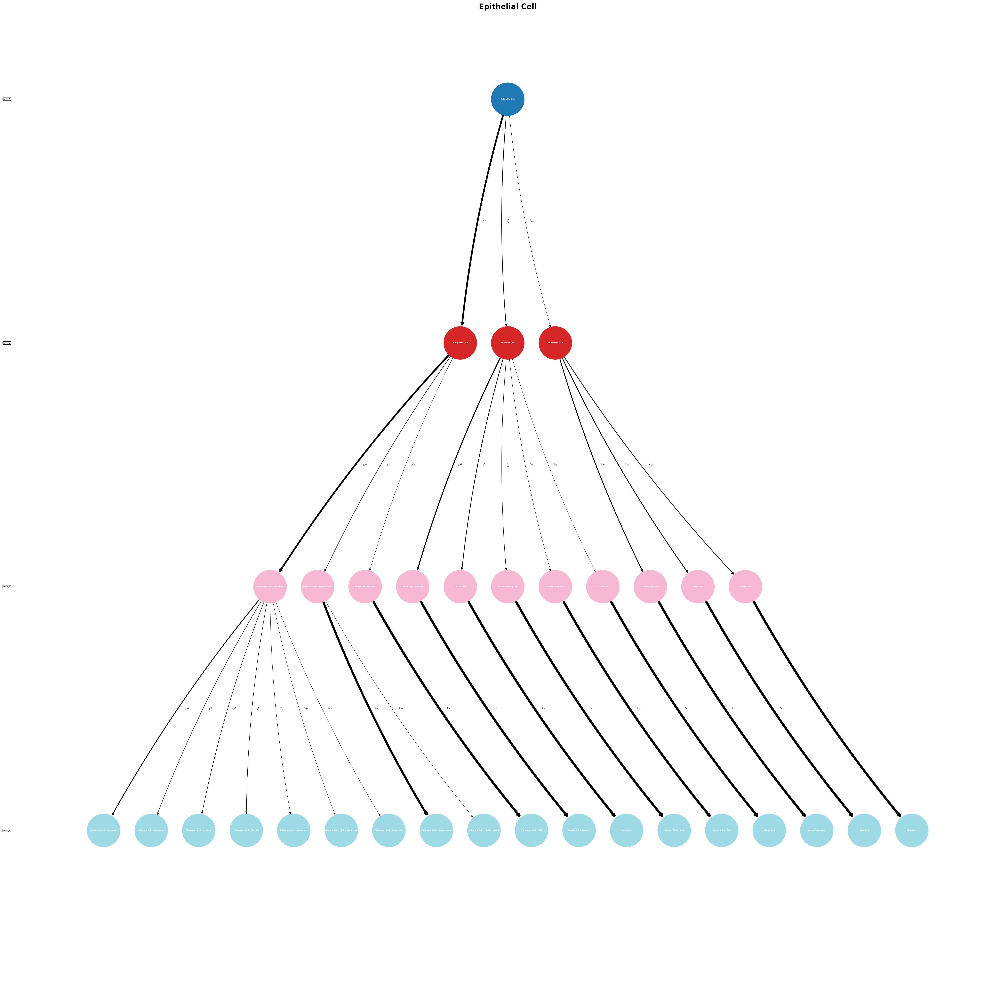

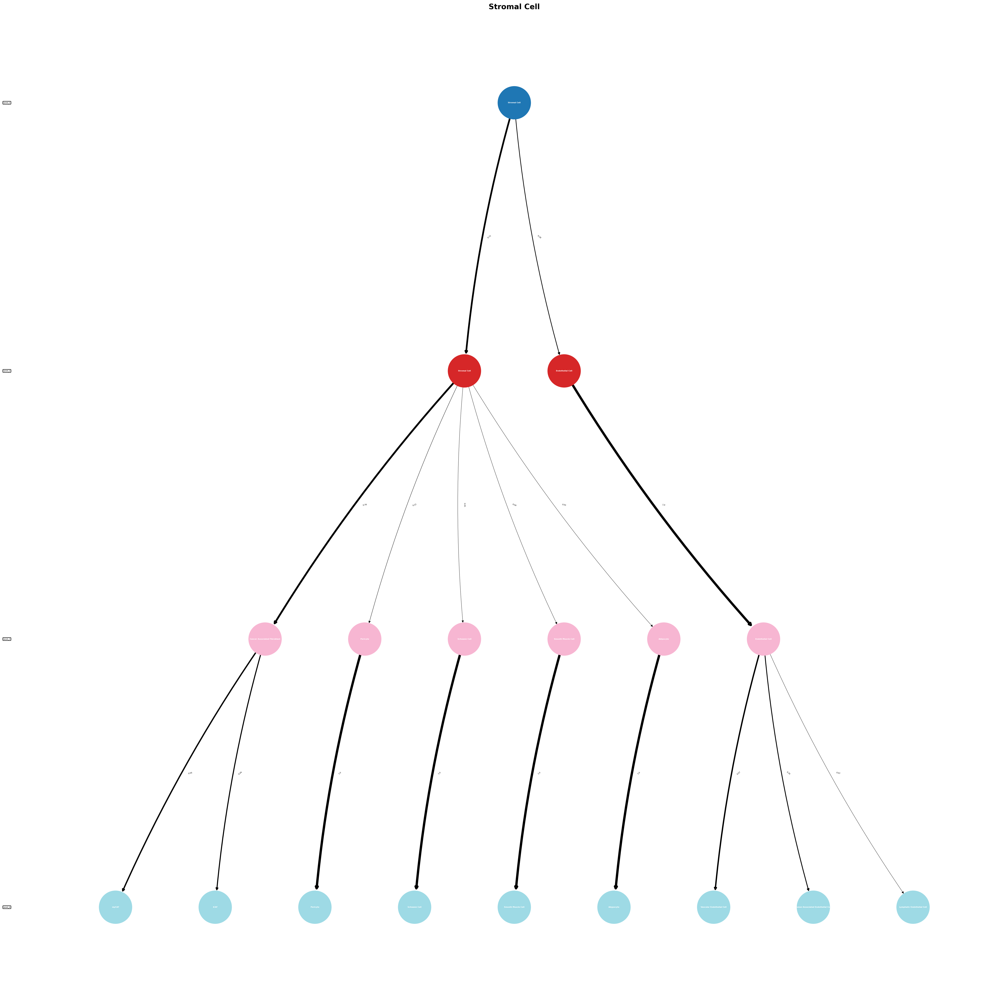

In [171]:
for cell_type in adata.obs.Level_1.unique().tolist():
    adata_temp = adata[adata.obs.Level_1== cell_type] #.copy()
    fig = clustree(
        adata_temp,
        cluster_keys,
        title=f'{cell_type}',
        show_fraction=True, 
        node_size_range=(5000, 5000), x_spacing = 2)
    # Adjust figure size and resolution
    fig.set_size_inches(30,30)
    fig.set_dpi(100)
 # Reduce font size of all text elements
    for ax in fig.axes:
        for text in ax.texts:
            text.set_fontsize(4) 
    fig.tight_layout()
    fig.show()

In [176]:
adata.obs = adata.obs.replace('Adypocyte', 'Adipocyte')

In [178]:
pd.set_option('display.max_rows', None)
adata.obs.groupby(['Level_4', 'Level_2']).size().unstack()

Level_2,Endocrine Cell,Endothelial Cell,Exocrine Cell,Lymphoid,Malignant Cell,Myeloid,Stromal Cell
Level_4,,,,,,,
Acinar (REG+) Cell,0,0,11234,0,0,0,0
Acinar Cell,0,0,4342,0,0,0,0
Acinar Idling Cell,0,0,7371,0,0,0,0
Dendritic Cell - Activated,0,0,0,0,0,556,0
Adipocyte,0,0,0,0,0,0,1407
Alpha Cell,4725,0,0,0,0,0,0
B Cell - Activated,0,0,0,14069,0,0,0
B Cell - Germinal Center,0,0,0,2176,0,0,0
B Cell - Memory,0,0,0,5334,0,0,0


In [181]:
adata

AnnData object with n_obs × n_vars = 726054 × 2505
    obs: 'Barcode', 'Dataset', 'ID_batch_covariate', 'Unique_ID', 'Technology', 'n_genes', 'n_counts', 'log_counts', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'leiden', 'batch', 'leiden_0.2', 'leiden_0.2_annotation', 'leiden_subcluster', 'level0_leiden_subcluster', 'leiden_0.5', 'is_outlier_total_counts', 'outlier', 'infercnv_score_malignant', 'infercnv_score_malignant_refined', 'cnv_score_abs', 'treatment_status', 'Level_0', 'MALAT1_lognorm', 'empty_droplet', 'ID_harmonised', 'Dataset_unique', 'Tissue', 'Age', 'Sex', 'Diabetes', 'Treatment', 'Global_Leiden', 'Treatment_Harmonized', 'Treatment_Category', 'Myeloid_leiden_0.75', 'Fibroblast_leiden_0.75', 'Lymphoid_leiden_0.75', 'Endothelial_Cell_leiden_0.75', 'Malignant_leiden_0.75', 'Ductal_Cell_leiden_0.75', 'Schwann_Cell_leiden_0.75', 'Adipocyte_leiden_0.75', 'Endo

# Add to Anndata with All Genes

In [182]:
adata_all_genes = sc.read_h5ad('2025_05_20_refined_annotation.h5ad')

In [183]:
adata_all_genes

AnnData object with n_obs × n_vars = 726054 × 39024
    obs: 'Barcode', 'Dataset', 'ID_batch_covariate', 'Unique_ID', 'Technology', 'n_genes', 'n_counts', 'log_counts', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'leiden', 'batch', 'leiden_0.2', 'leiden_0.2_annotation', 'leiden_subcluster', 'level0_leiden_subcluster', 'leiden_0.5', 'is_outlier_total_counts', 'outlier', 'infercnv_score_malignant', 'infercnv_score_malignant_refined', 'cnv_score_abs', 'treatment_status', 'Level_0', 'MALAT1_lognorm', 'empty_droplet', 'ID_harmonised', 'Dataset_unique', 'Tissue', 'Age', 'Sex', 'Diabetes', 'Treatment', 'Global_Leiden', 'Treatment_Harmonized', 'Treatment_Category', 'Myeloid_leiden_0.75', 'Fibroblast_leiden_0.75', 'Lymphoid_leiden_0.75', 'Endothelial_Cell_leiden_0.75', 'Malignant_leiden_0.75', 'Ductal_Cell_leiden_0.75', 'Schwann_Cell_leiden_0.75', 'Adipocyte_leiden_0.75', 'End

In [184]:
adata_all_genes.obs = adata.obs.copy()
adata_all_genes.obsm = adata.obsm.copy()
adata_all_genes.obsp = adata.obsp.copy()
adata_all_genes.uns = adata.uns.copy()

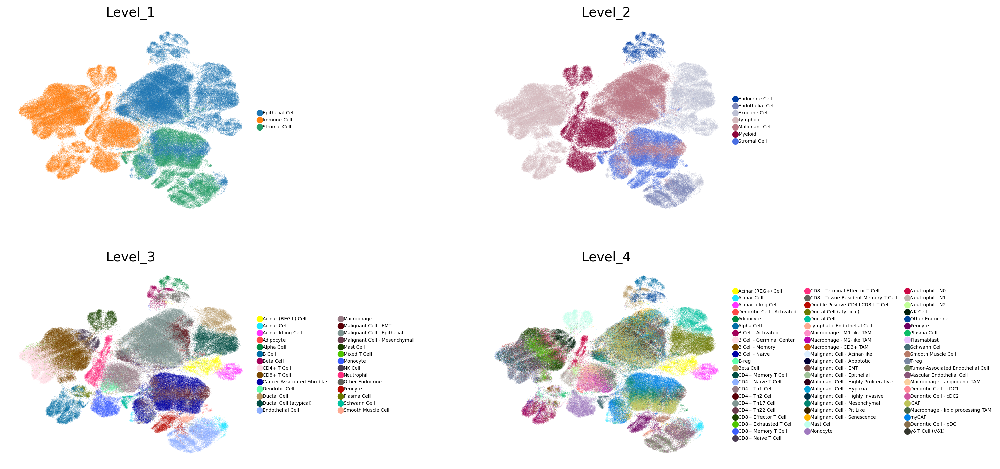

In [185]:
sc.pl.umap(adata_all_genes, color=[ 'Level_1', 'Level_2', 'Level_3', 'Level_4'], ncols=2, frameon=False, legend_fontsize=5, wspace=0.75)

In [186]:
adata.write('final_scanVI/final_object_mg.h5ad')
adata_all_genes.write('final_scanVI/final_object_all_genes.h5ad')

In [189]:
obs = adata.obs.copy()

In [190]:
obs.to_csv('final_object_obs.csv')

In [193]:
pwd

'/ictstr01/groups/ml01/workspace/shrey.parikh/PDAC_Work_Dir/PDAC_Final/Downstream'